# Multi-class Dog Breed Classification 🐕 🐶

Building an end-to-end multi-class image classifier using 
TensorFlow 2.0 and TensorFlow Hub.

##### - Goal
Identifying the breed of a dog with an image of dog.

##### - Data
The data used in this project is from Dog Breed Identification Competition by Kaggle.
https://www.kaggle.com/c/dog-breed-identification/data

##### - Evaluation
The evaluation file consists of the prediction probabilities for each dog breed of each test image.
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

##### - Features
- Unstructured data using deep Learning/transfer learning.
- Using 120 different breeds of dogs (120 classes)
- Using 10,000+ images in the training set and 10,000 images in the test set.


In [1]:
from tensorflow.python.framework.config import list_physical_devices
import tensorflow as tf
import tensorflow_hub as hub

# Checking for GPU
print("GPU", "available (Yes)" if tf.config.list_physical_devices("GPU") else "not available")

GPU not available


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

labels_csv = pd.read_csv("drive/My Drive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     4d07baea3d7e78ff59ba05dda3f3932a  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


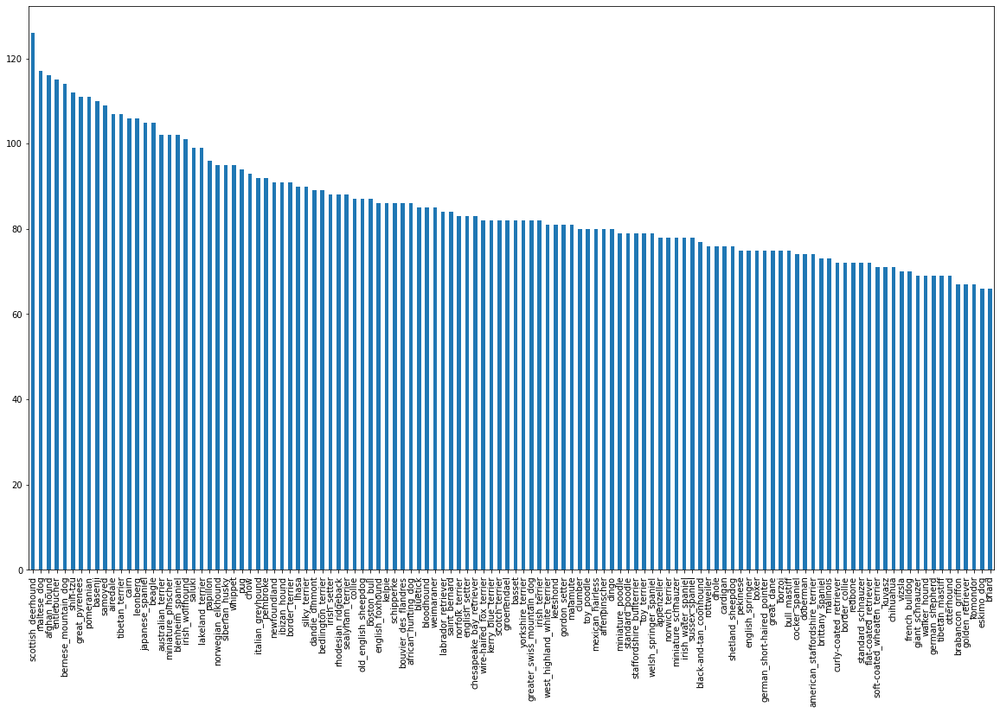

In [3]:
# Checking the number of labels for each breed

labels_csv["breed"].value_counts().plot.bar(figsize=(20, 12));

In [4]:
labels_csv["breed"].value_counts().median()

82.0

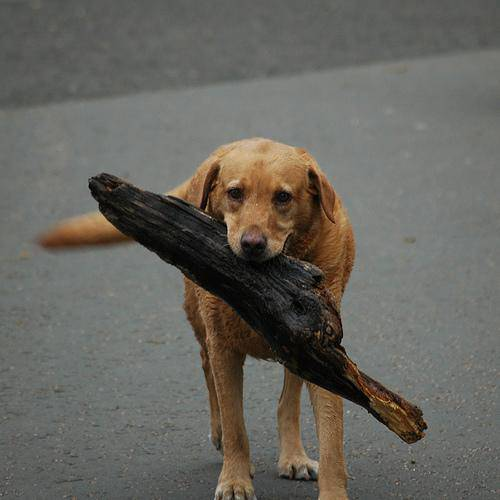

In [5]:
from IPython.display import Image
Image("drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg")

#### Images and labels

In [6]:
# Creating path-names funtion from Image ID
filenames = ["drive/My Drive/Dog Vision/train/"+ fname + ".jpg" for fname in labels_csv["id"]]
filenames[:20]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/My Drive/Dog Vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/My Drive/Dog Vision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/My Drive/Dog Vision/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'drive/My Drive/Dog Vision/train/006cc3ddb9dc1bd82

In [7]:
# Checking the number of filenames matches with the original Image file names
import os
if len(os.listdir("drive/My Drive/Dog Vision/train/")) == len(filenames):
  print("Filenames match")
else:
  print("Filenames did not match")

Filenames did not match


In [8]:
labels_csv.head(10)

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
5,002211c81b498ef88e1b40b9abf84e1d,bedlington_terrier
6,00290d3e1fdd27226ba27a8ce248ce85,bedlington_terrier
7,002a283a315af96eaea0e28e7163b21b,borzoi
8,003df8b8a8b05244b1d920bb6cf451f9,basenji
9,0042188c895a2f14ef64a918ed9c7b64,scottish_deerhound


In [9]:
# Converting
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels, len(labels)

(array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
        'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object),
 10222)

In [10]:
# Checking the number of labels with the number of filenames
if len(labels) == len(filenames):
  print("Matched")
else:
  print("Did not match")

Matched


In [11]:
# Checking unique values of label
unique_breeds = np.unique(labels)
unique_breeds, len(unique_breeds)

(array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
        'american_staffordshire_terrier', 'appenzeller',
        'australian_terrier', 'basenji', 'basset', 'beagle',
        'bedlington_terrier', 'bernese_mountain_dog',
        'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
        'bluetick', 'border_collie', 'border_terrier', 'borzoi',
        'boston_bull', 'bouvier_des_flandres', 'boxer',
        'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
        'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
        'chow', 'clumber', 'cocker_spaniel', 'collie',
        'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
        'doberman', 'english_foxhound', 'english_setter',
        'english_springer', 'entlebucher', 'eskimo_dog',
        'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
        'german_short-haired_pointer', 'giant_schnauzer',
        'golden_retriever', 'gordon_setter', 'gre

In [12]:
# Converting labels into array of booleans (for unique values)
print(labels[0])
labels[0] == unique_breeds 

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [13]:
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2], len(boolean_labels)

([array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False,  True, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False]),
  array([False, False, False, Fa

In [14]:
print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [15]:
print(labels[8])
print(boolean_labels[8].astype(int))

basenji
[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


#### Creating a validation set

In [16]:
# X & y
X = filenames
y = boolean_labels

###### Only using 1000 images to start

In [17]:
# Number of images for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [18]:
# Spliting into train and validation set
from sklearn.model_selection import train_test_split

# Splitting into training and validation set of total size NUM_IMAGES 
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [19]:
# Checking
X_train[:2], y_train[:2]

(['drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, F

## Pre-processing images by converting images into `Tensors`

In [20]:
# importing an image using numpy for example
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape # Output = Height, Width and RGB Color channels)

(257, 350, 3)

In [21]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [22]:
tf.constant(image)[:2] # Converting a numpy array into Tensors

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

#### Pre-processing function
- An image filepath as input
- TensorFlow to read file and save image variable
- Turn .jpg into Tensors
- Image normalization by converting color channel values
from 0-255 to 0-1
- Resize image (eg- 200, 200)
- Return the modified image

In [23]:
IMG_SIZE = 224

# Function for pre-processing images
def process_image(image_path, img_size=IMG_SIZE):
  # Reading an image file in Tensors
  image = tf.io.read_file(image_path)
  # Converting jpeg images into numerical Tensors with 3 color channels (RBG)
  image = tf.image.decode_jpeg(image, channels=3)
  # Converting the color channel values from 0-255 to 0-1 values (Normalisation)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resizing the image
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

###### Converting data into batches 

In [24]:
# Function to return a tuple of Tensors (image, label)
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

In [25]:
# Define the batch size
BATCH_SIZE = 32

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  if test_data:
    print("Creating test data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  elif valid_data:
    print("Creating validation data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    data = data.shuffle(buffer_size=len(X))
    data = data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)

    return data_batch

In [26]:
# Creating validation and training data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches
Creating validation data batches


In [27]:
# Checking different attributes of the data batches
train_data.element_spec, val_data.element_spec 

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

##### Data Batches Visualization

In [106]:
# Function for visualization
import matplotlib.pyplot as plt

def show_25_images(images, labels):
  plt.figure(figsize=(10, 10))
  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [29]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

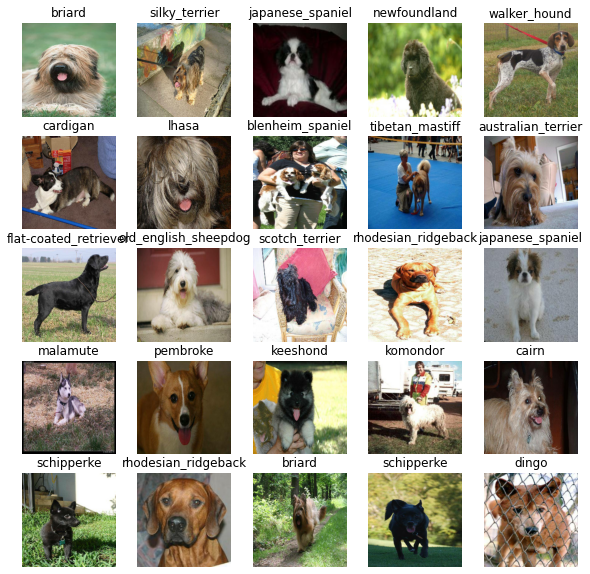

In [30]:
# Visualization
import matplotlib.pyplot as plt
show_25_images(train_images, train_labels)

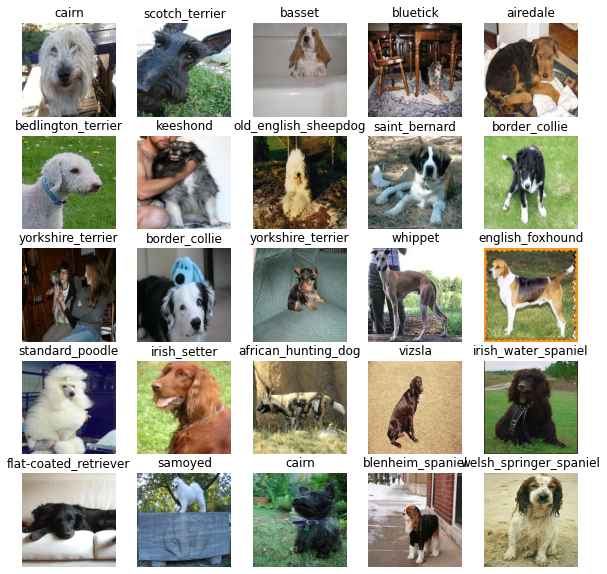

In [31]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Modelling 

In [32]:
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]
OUTPUT_SHAPE = len(unique_breeds)
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

In [33]:
# Keras deep learning model function
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Modelling with:", MODEL_URL)
  model = tf.keras.Sequential([
                               hub.KerasLayer(MODEL_URL),
                               tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                                     activation="softmax")])
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"])
  model.build(INPUT_SHAPE)
  return model 

In [34]:
model = create_model()
model.summary()

Modelling with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [35]:
outputs = np.ones(shape=(1,1, 1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

In [36]:
# TensorBoard Callbacks
%load_ext tensorboard

In [37]:
import datetime

# TensorBoard callback function
def create_tensorboard_callback():
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [38]:
# Early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

In [39]:
# Model training check on a subset of data (1000 images)
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [40]:
# Model training function
def train_model():
  model = create_model()
  tensorboard = create_tensorboard_callback()
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model

In [ ]:
model = train_model()

Modelling with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 10s 197ms/step - loss: 4.4921 - accuracy: 0.0988 - val_loss: 3.4640 - val_accuracy: 0.2550
Epoch 2/100
25/25 [==============================] - 4s 176ms/step - loss: 1.6127 - accuracy: 0.6850 - val_loss: 2.2554 - val_accuracy: 0.4850
Epoch 3/100
25/25 [==============================] - 4s 177ms/step - loss: 0.5521 - accuracy: 0.9438 - val_loss: 1.7613 - val_accuracy: 0.5700
Epoch 4/100
25/25 [==============================] - 5s 187ms/step - loss: 0.2542 - accuracy: 0.9850 - val_loss: 1.5580 - val_accuracy: 0.6100
Epoch 5/100
25/25 [==============================] - 4s 173ms/step - loss: 0.1467 - accuracy: 0.9975 - val_loss: 1.4839 - val_accuracy: 0.6250
Epoch 6/100
25/25 [==============================] - 5s 188ms/step - loss: 0.1005 - accuracy: 1.0000 - val_loss: 1.4391 - val_accuracy: 0.6400
Epoch 7/100
25/25 [==============================] - 

In [ ]:
# TensorBoard logs check
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

In [42]:
# Evaluation & predictions on the validation data
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 8s 1s/step


array([[0.00108346, 0.00567773, 0.01952133, ..., 0.00133991, 0.00184019,
        0.00778154],
       [0.00911501, 0.00842708, 0.01859787, ..., 0.01741302, 0.00421661,
        0.00454575],
       [0.0012574 , 0.05975639, 0.00058677, ..., 0.03420394, 0.00126378,
        0.00369957],
       ...,
       [0.01052169, 0.00747019, 0.00025904, ..., 0.00437034, 0.00688044,
        0.00241697],
       [0.00141697, 0.00495541, 0.0024741 , ..., 0.00490128, 0.0075327 ,
        0.01015811],
       [0.00173291, 0.01013263, 0.00039787, ..., 0.00559326, 0.000314  ,
        0.00475748]], dtype=float32)

In [43]:
predictions.shape, len(y_val)

((200, 120), 200)

In [44]:
len(predictions[0])

120

In [45]:
predictions[0]

array([1.0834616e-03, 5.6777336e-03, 1.9521326e-02, 1.0438371e-03,
       2.4997465e-02, 3.4723231e-03, 9.9060347e-04, 1.4889047e-03,
       4.8872153e-03, 8.1990566e-03, 7.0663972e-04, 2.0305510e-03,
       1.0073889e-03, 1.3641979e-02, 1.9746363e-02, 1.8808823e-03,
       8.6631756e-03, 6.9291162e-04, 4.0925057e-03, 2.6107009e-03,
       7.4884840e-03, 9.6293734e-03, 1.0895163e-03, 7.6734177e-03,
       3.3657404e-03, 1.4140008e-03, 4.2236503e-03, 2.0262985e-02,
       1.3728930e-04, 3.4034741e-03, 7.4630341e-04, 3.4328431e-04,
       2.7511641e-02, 7.8605283e-03, 4.9755501e-04, 2.8797630e-02,
       1.1237058e-03, 9.7119734e-03, 7.4098306e-03, 6.3169521e-04,
       6.5486226e-03, 7.2584767e-04, 1.3848792e-03, 5.8277063e-03,
       1.6701790e-04, 8.0873596e-04, 4.2075580e-03, 4.1989844e-02,
       1.2768258e-01, 1.7865688e-03, 6.0846534e-04, 2.2740974e-03,
       5.8103227e-03, 1.0862886e-03, 1.4084539e-01, 1.4768890e-02,
       3.2662447e-03, 2.6018370e-03, 5.4296432e-03, 1.8059621e

In [46]:
np.sum(predictions[0]), np.sum(predictions[1])

(1.0, 1.0)

In [ ]:
# Prediction 1
index = 42
print(predictions[0])
print(f"Max value(probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.68849202e-03 1.69486288e-04 6.23684609e-04 2.92131281e-05
 4.57524206e-04 2.48751254e-04 1.68884676e-02 3.83080333e-04
 2.85462476e-04 4.26003593e-04 8.19394249e-04 5.15494146e-04
 7.00205332e-04 9.16326007e-06 7.20230164e-05 1.15074788e-03
 8.84614128e-05 1.78069606e-01 4.51051237e-05 5.44185859e-05
 2.18642503e-03 6.95071722e-05 1.13571705e-05 6.35595527e-04
 4.65726989e-05 1.68072031e-04 3.70484412e-01 1.02431462e-04
 4.99469694e-04 8.35272876e-05 2.79547767e-05 4.11052228e-04
 2.03652977e-04 3.17286394e-05 9.17065991e-05 2.21557505e-02
 1.21466655e-05 2.12180792e-04 4.19871241e-04 1.11350237e-04
 7.59235118e-03 1.22006459e-04 1.68049679e-04 1.69583160e-04
 1.63456716e-04 1.61319214e-04 1.38402665e-05 1.88178703e-04
 2.23664319e-04 6.63746978e-05 8.28486285e-04 1.90550752e-04
 7.63643257e-05 1.22360347e-04 1.17222851e-04 1.12241542e-04
 3.52513889e-04 2.32140999e-03 1.74336194e-03 2.24302653e-02
 6.25033863e-04 1.14855893e-05 3.46242712e-04 9.69359535e-05
 6.25823275e-04 5.065662

In [ ]:
unique_breeds[113]

'walker_hound'

###### Visualizing and scaling (confidence levels or prediction probabilities)

In [107]:
# Prediction probabilites
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label = get_pred_label(predictions[0])
pred_label

'groenendael'

In [108]:
# Function to unbatch a batched dataset
def unbatchify(data):
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

val_images, val_labels = unbatchify(val_data)
val_images[0], val_images[0]    

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [109]:
# Plotting the predicted label, predicted probability, truth label and the target image using a function
def plot_pred(prediction_probabilities, labels, images, n=1):
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  pred_label = get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color = "green"
  else:
    color = "orange"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)   

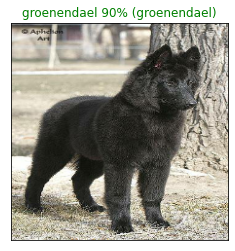

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=45)

In [110]:
# Function to view & plot top 10 models
def plot_pred_confidence(prediction_probabilities, labels, n=1):
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  pred_label = get_pred_label(pred_prob)
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  top_10_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                        top_10_pred_values,
                        color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  if np.isin(true_label, top_10_pred_labels):
    top_10_plot[np.argmax(top_10_pred_labels == true_label)].set_color("blue")
  else:
    pass

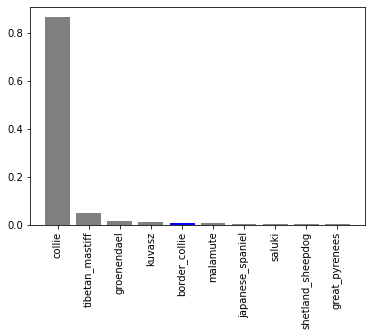

In [ ]:
plot_pred_confidence(prediction_probabilities=predictions,
                     labels=val_labels,
                     n=9)

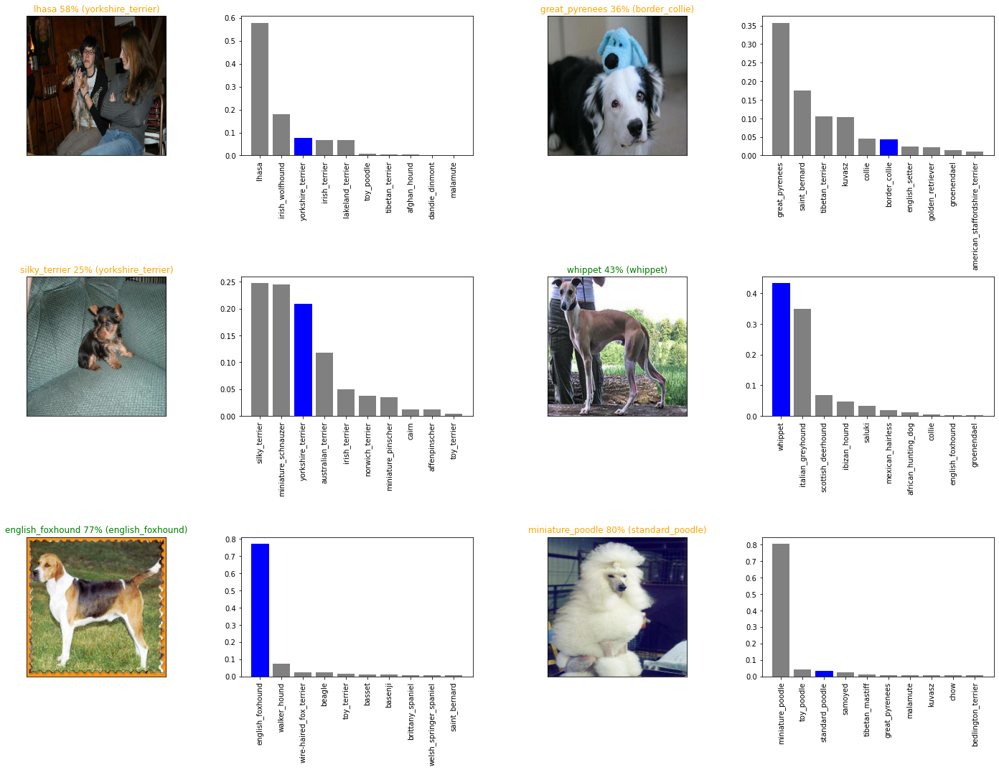

In [ ]:
# Trying visualizations of some predictions and its different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_confidence(prediction_probabilities=predictions,
                       labels=val_labels,
                       n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [48]:
# Saving and exporting the model using a function
def save_model(model, suffix=None):
  modeldir = os.path.join("drive/My Drive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Saving the model at: {model_path}")
  model.save(model_path)
  return model_path

In [49]:
# Load model function
def load_model(model_path):
  print(f"Loading model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Saving 1000 images trained model
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving the model at: drive/My Drive/Dog Vision/models/20211217-11591639742397-1000-images-mobilenetv2-Adam.h5


'drive/My Drive/Dog Vision/models/20211217-11591639742397-1000-images-mobilenetv2-Adam.h5'

In [50]:
# Loading "1000-images-mobilenetv2-Adam" model
loaded_1000_image_model = load_model("drive/My Drive/Dog Vision/models/20211217-11591639742397-1000-images-mobilenetv2-Adam.h5")

Loading model from: drive/My Drive/Dog Vision/models/20211217-11591639742397-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Pre-saved model evaluation
model.evaluate(val_data)

7/7 [==============================] - 1s 147ms/step - loss: 1.2862 - accuracy: 0.6750


[1.2862080335617065, 0.675000011920929]

In [ ]:
# Loaded model evaluation
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 3s 163ms/step - loss: 1.2862 - accuracy: 0.6750


[1.2862080335617065, 0.675000011920929]

In [51]:
# Training on 10,000 images

all_data = create_data_batches(X, y)

Creating training data batches


In [52]:
all_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [53]:
all_model = create_model()

Modelling with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
all_model_tensorboard = create_tensorboard_callback()
all_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                            patience=3)

In [ ]:
all_model.fit(x=all_data,
              epochs=NUM_EPOCHS,
              callbacks=[all_model_tensorboard, all_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 67s 179ms/step - loss: 1.3305 - accuracy: 0.6708
Epoch 2/100
320/320 [==============================] - 44s 138ms/step - loss: 0.3996 - accuracy: 0.8829
Epoch 3/100
320/320 [==============================] - 43s 135ms/step - loss: 0.2368 - accuracy: 0.9349
Epoch 4/100
320/320 [==============================] - 43s 135ms/step - loss: 0.1540 - accuracy: 0.9638
Epoch 5/100
320/320 [==============================] - 43s 134ms/step - loss: 0.1060 - accuracy: 0.9797
Epoch 6/100
320/320 [==============================] - 43s 135ms/step - loss: 0.0760 - accuracy: 0.9863
Epoch 7/100
320/320 [==============================] - 43s 135ms/step - loss: 0.0587 - accuracy: 0.9914
Epoch 8/100
320/320 [==============================] - 43s 134ms/step - loss: 0.0458 - accuracy: 0.9945
Epoch 9/100
320/320 [==============================] - 43s 135ms/step - loss: 0.0374 - accuracy: 0.9969
Epoch 10/100
320/320 [==============================] - 43s 135m

In [ ]:
save_model(all_model, suffix="all-image-set-mobilenetv2-Adam")

Saving the model at: drive/My Drive/Dog Vision/models/20211217-12471639745266-all-image-set-mobilenetv2-Adam.h5


'drive/My Drive/Dog Vision/models/20211217-12471639745266-all-image-set-mobilenetv2-Adam.h5'

In [54]:
loaded_1000_image_model = load_model("drive/My Drive/Dog Vision/models/20211217-12471639745266-all-image-set-mobilenetv2-Adam.h5")

Loading model from: drive/My Drive/Dog Vision/models/20211217-12471639745266-all-image-set-mobilenetv2-Adam.h5


## Making predictions

In [55]:
# Loading test images filenames
test_path = "drive/My Drive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/Dog Vision/test/e330d9cfe81e42338ddbf8a121930e83.jpg',
 'drive/My Drive/Dog Vision/test/e487437a727b3e4f0b919c878d39ae6e.jpg',
 'drive/My Drive/Dog Vision/test/e644a1f6f9c69ee8f7e8d834730bbfd7.jpg',
 'drive/My Drive/Dog Vision/test/e1d31decdd6521df89e59d181f0c73ed.jpg',
 'drive/My Drive/Dog Vision/test/e200fe397f6ca5d626210830fc38aca9.jpg',
 'drive/My Drive/Dog Vision/test/e0806e5049519130d459dd7bd640a092.jpg',
 'drive/My Drive/Dog Vision/test/e67cd079a0f9c15ebee3c41743906c73.jpg',
 'drive/My Drive/Dog Vision/test/e26901a9e04f0ba89765fb9b9b7f675f.jpg',
 'drive/My Drive/Dog Vision/test/e073f14cd5f4c1a62cdb0108cca62fdd.jpg',
 'drive/My Drive/Dog Vision/test/e596c0d97b381e876d46dda2eb60074c.jpg']

In [56]:
len(test_filenames)

10357

In [57]:
# Making test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches


In [58]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [ ]:
# Prediction on the test data batch using loaded_model
test_predictions = loaded_1000_image_model.predict(test_data,
                                                   verbose=1)

In [60]:
test_predictions = np.loadtxt("drive/My Drive/Dog Vision/preds_array0.csv", delimiter=",")

In [62]:
test_predictions[:10], test_predictions.shape

(array([[1.61196489e-09, 3.44086413e-12, 2.32834394e-11, ...,
         1.06917716e-13, 1.58530451e-08, 1.52161670e-06],
        [3.17894322e-10, 3.20088262e-14, 1.85374840e-10, ...,
         7.00588814e-08, 1.88822238e-08, 2.56980937e-10],
        [4.27301083e-09, 1.84139528e-13, 1.11784948e-09, ...,
         2.71949238e-12, 2.23927123e-06, 7.41860809e-11],
        ...,
        [4.47232779e-10, 4.28004029e-07, 4.11986996e-08, ...,
         4.65437893e-07, 8.21722967e-10, 8.86002116e-09],
        [3.50528079e-11, 1.94377336e-03, 1.44941642e-10, ...,
         1.56135718e-06, 6.13228721e-08, 7.32120961e-12],
        [1.23221771e-08, 3.08354520e-09, 1.87174110e-10, ...,
         8.16165635e-10, 9.98905063e-01, 6.73740752e-09]]), (10357, 120))

In [63]:
# Kaggle competition submission format (id column, breeds and prediction probabilites)
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [67]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]

In [65]:
os.path.splitext(test_filenames[0])

('drive/My Drive/Dog Vision/test/e330d9cfe81e42338ddbf8a121930e83', '.jpg')

In [68]:
test_ids

['e330d9cfe81e42338ddbf8a121930e83',
 'e487437a727b3e4f0b919c878d39ae6e',
 'e644a1f6f9c69ee8f7e8d834730bbfd7',
 'e1d31decdd6521df89e59d181f0c73ed',
 'e200fe397f6ca5d626210830fc38aca9',
 'e0806e5049519130d459dd7bd640a092',
 'e67cd079a0f9c15ebee3c41743906c73',
 'e26901a9e04f0ba89765fb9b9b7f675f',
 'e073f14cd5f4c1a62cdb0108cca62fdd',
 'e596c0d97b381e876d46dda2eb60074c',
 'e190bfb63cf9a7cf1b3ae2ea654a735b',
 'e8f51d54d179b05ea4cc9c726cae9229',
 'f4af276965865188983afcbb5fca9cc2',
 'ed6d16749ad7dbed282857c6c0cb0b64',
 'e83fec66a32873298df9fa5fdac113aa',
 'f599f4d08388e69960e17234ebd0beba',
 'f58a21665136bb6aa4aa90c485be4315',
 'ec7eab1c7a2275c89f2d3eca6e4afea2',
 'f574f558d78db4e616e91f5dd5347409',
 'f1f42942df460f38181e12ebce695b5e',
 'ed48b89faa9069c700db2448696a97af',
 'f1c41fe76fb9962343d34c58efb384cd',
 'e8f67d8d36c49d7436aab680e798b685',
 'e9b16b4bdf5b0561fc7c69b2f36e1a7e',
 'edf164f8974510c5936ee7224f3d7d56',
 'eb2f2ad0f785a7c85f8c62969be71e2a',
 'f367d08148f74a726ce8f1a2c4c38e81',
 

In [69]:
preds_df["id"] = test_ids

In [70]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e330d9cfe81e42338ddbf8a121930e83,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e487437a727b3e4f0b919c878d39ae6e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e644a1f6f9c69ee8f7e8d834730bbfd7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e1d31decdd6521df89e59d181f0c73ed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e200fe397f6ca5d626210830fc38aca9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [72]:
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e330d9cfe81e42338ddbf8a121930e83,1.61196e-09,3.44086e-12,2.32834e-11,1.40799e-12,5.98033e-09,2.14534e-11,5.32852e-10,1.76493e-10,4.49106e-11,1.84297e-09,5.29733e-14,6.22357e-09,5.95073e-13,2.66395e-08,3.28688e-15,1.21886e-11,1.19793e-08,2.38418e-13,4.40796e-10,3.99063e-11,2.83421e-13,3.95439e-12,1.97963e-10,8.23695e-11,1.06677e-05,1.19701e-14,9.42684e-11,6.76077e-11,1.22097e-11,1.13671e-05,2.65429e-12,2.08955e-10,3.13114e-10,2.81222e-09,4.10381e-15,1.54404e-13,8.28562e-12,3.35177e-12,7.26732e-13,...,1.53728e-13,7.92547e-11,1.125e-12,1.63081e-11,0.999948,1.07531e-08,6.96737e-08,2.58429e-05,4.69993e-12,5.38787e-13,4.42572e-15,1.21052e-14,5.82161e-12,2.23169e-11,6.22246e-07,3.04142e-10,2.66839e-11,2.75708e-14,7.93131e-14,1.32076e-06,2.44035e-10,6.31364e-09,1.15631e-08,1.22175e-09,1.5485e-11,8.52924e-12,2.88824e-12,7.2787e-12,2.44715e-14,4.71957e-08,8.20066e-09,4.05677e-08,2.20215e-11,3.07456e-12,7.0806e-12,3.02453e-09,2.99173e-07,1.06918e-13,1.5853e-08,1.52162e-06
1,e487437a727b3e4f0b919c878d39ae6e,3.17894e-10,3.20088e-14,1.85375e-10,1.95466e-13,8.68222e-07,3.36228e-07,2.26471e-06,0.999593,1.87668e-10,1.44469e-07,2.03675e-09,5.92063e-12,1.10664e-11,7.59322e-09,6.66672e-11,1.07453e-10,6.06718e-10,6.86744e-10,2.8105e-11,1.3714e-09,8.18679e-12,1.00465e-09,4.08705e-10,7.98117e-13,2.6706e-10,1.88958e-13,2.03424e-10,1.14916e-05,8.09342e-11,7.07004e-08,4.19179e-10,8.6505e-13,1.01143e-13,2.06352e-09,8.75542e-11,1.11979e-14,1.37751e-08,5.86843e-06,2.54069e-10,...,3.98128e-08,9.75653e-12,2.45684e-11,2.453e-13,4.44202e-08,2.08894e-11,4.48524e-06,7.26081e-11,3.35534e-10,9.14727e-08,2.06103e-09,7.40757e-13,1.78977e-11,3.20656e-11,1.8672e-10,1.0017e-08,4.42345e-11,4.78339e-11,3.828e-11,1.22619e-10,3.76022e-09,3.04148e-08,1.34791e-07,2.77854e-10,1.31859e-09,1.09374e-11,4.616e-11,6.4806e-13,3.30366e-13,1.88458e-11,3.44167e-07,0.000112944,6.6752e-09,1.69071e-06,6.80441e-10,5.92343e-09,5.57415e-09,7.00589e-08,1.88822e-08,2.56981e-10
2,e644a1f6f9c69ee8f7e8d834730bbfd7,4.27301e-09,1.8414e-13,1.11785e-09,1.10664e-10,7.22501e-11,1.16924e-05,7.22326e-07,0.000555337,9.78565e-11,1.72204e-07,1.12471e-12,5.61475e-06,3.19121e-09,8.96468e-09,6.1726e-12,1.56086e-10,9.55186e-07,7.99785e-12,9.66919e-08,5.34925e-11,1.30223e-12,2.23705e-13,1.57456e-13,9.01699e-12,8.34153e-08,2.40414e-13,1.74604e-10,1.31652e-05,1.00012e-10,1.19407e-07,3.41525e-08,2.56724e-12,7.05523e-11,1.19703e-06,6.52978e-11,1.53339e-11,1.97418e-07,4.31401e-09,1.41566e-10,...,1.26193e-07,1.83583e-07,1.09725e-10,9.71679e-09,1.00777e-06,1.43315e-09,0.999301,1.10322e-09,3.00328e-12,6.40536e-10,4.37618e-13,8.66561e-11,1.54382e-08,3.7188e-10,7.22425e-09,1.6949e-06,1.01102e-09,1.49047e-11,1.07289e-11,4.92782e-06,1.34003e-09,1.47905e-07,2.36387e-07,7.56329e-10,3.09975e-11,1.60226e-10,7.86962e-10,8.08168e-14,2.3197e-11,7.2096e-10,3.53046e-09,4.605e-05,9.58619e-12,2.74033e-08,8.79864e-12,2.79368e-08,1.50221e-07,2.7

In [73]:
preds_df.to_csv("drive/My Drive/Dog Vision/final_model_predictions_submission_01.csv", index=False)

## Predictions on raw images (new images)

In [121]:
custom_path = "drive/My Drive/Dog Vision/testpics/"
custom_image_path =[custom_path + fname for fname in os.listdir(custom_path)]

In [122]:
custom_image_path

['drive/My Drive/Dog Vision/testpics/010.jpg',
 'drive/My Drive/Dog Vision/testpics/006.jpg',
 'drive/My Drive/Dog Vision/testpics/007.jpg',
 'drive/My Drive/Dog Vision/testpics/005.jpg',
 'drive/My Drive/Dog Vision/testpics/003.jpg',
 'drive/My Drive/Dog Vision/testpics/004.jpg',
 'drive/My Drive/Dog Vision/testpics/001.jpg',
 'drive/My Drive/Dog Vision/testpics/008.jpg']

In [123]:
# batch 
custom_data = create_data_batches(custom_image_path, test_data=True)
custom_data

Creating test data batches


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [124]:
# Making predictions
custom_preds = loaded_1000_image_model.predict(custom_data)

In [125]:
custom_preds.shape

(8, 120)

In [126]:
custom_pred_label = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_label

['basenji',
 'staffordshire_bullterrier',
 'american_staffordshire_terrier',
 'boston_bull',
 'great_dane',
 'great_dane',
 'mexican_hairless',
 'pug']

In [127]:
custom_images = []
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

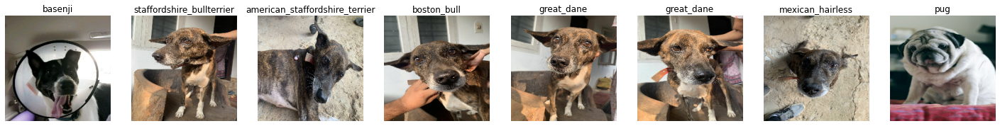

In [128]:
plt.figure(figsize=(25, 15))
for i, image in enumerate(custom_images):
  plt.subplot(1, 8, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_label[i])
  plt.imshow(image)
  plt.axis("off")